<a href="https://colab.research.google.com/github/viriditass/Papers/blob/main/StackGAN_Text_to_Photo_realistic_Image_Synthesis_with_Stacked_Generative_Adversarial_Networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **StackGAN: Text to Photo-realistic Image Synthesis with Stacked Generative Adversarial Networks**

논문 링크: https://arxiv.org/abs/1612.03242

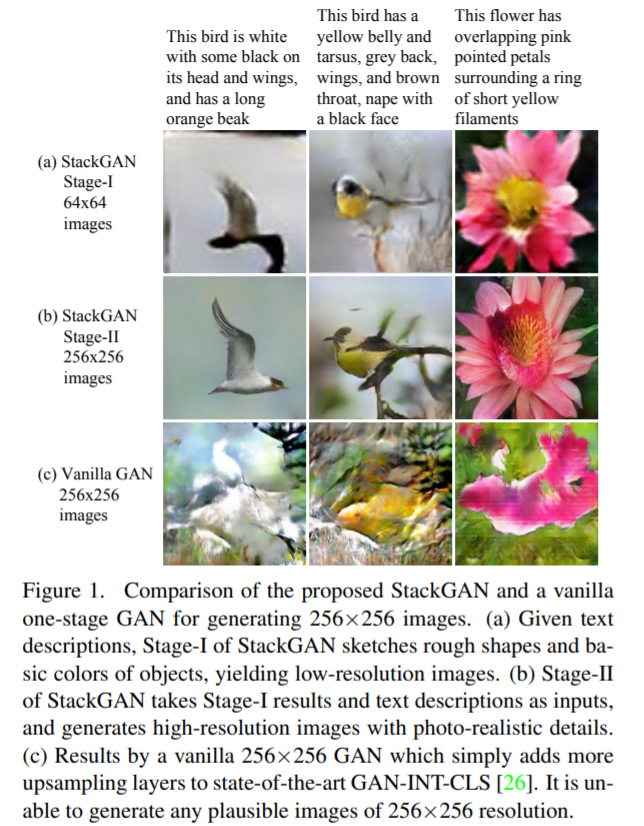

위의 그림 Figure 1은 StackGAN와 Vanilla GAN의 text to image를 비교한 것이다. 아래에서 살펴볼 예정이지만, StackGAN의 경우 이름과 같이 **Stage-1과 Stage-2를 쌓은 즉, stack을 한 형태**이다. Stage-1에서 저화질의 이미지를 만들고 이를 이용해 Stage-2에서 고화질의 이미지를 만든다. 위의 그림를 보면 알수있듯이 StackGAN의 최종 output인 StackGAN Stage-2와 Vanilla GAN이 생성한 이미지의 퀄리티 차이가 상당한 것을 알 수 있다.

StackGAN이 나오게 된 계기는 기존의 text to image는 주어진 문장을 기반으로 하나의 GAN을 통해 이미지를 생성했다. 하지만 text to image는 어려운 문제이기 때문에 두가지의 sub problem으로 나누어 보다 고해상도의 이미지를 생성하자는 아이디어가 나왔다.

## **StackGAN 구조**

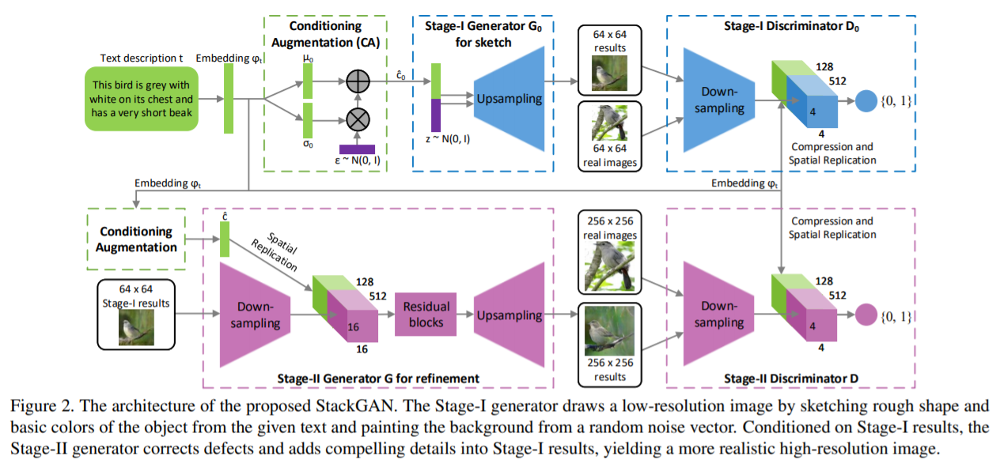

위의 그림 Figure 2를 보면 StackGAN이 **VAE와 GAN을 융합한 모델**임을 알 수 있다. 모델의 전반적인 구조는 위의 **Stage-1에서 저해상도의 이미지를 generate**하고, 이 단계에서 생성된 이미지를 기반으로 **Stage-2에서 좀더 정밀하고 고화질의 이미지를 생성**한다. StackGAN은 한정적인 데이터가 고차원의 text embedding 공간에서 불연속성을 야기하는 문제점을 해결하기 위해 도입한 구조이다.

### **Conditioning Augmentation**

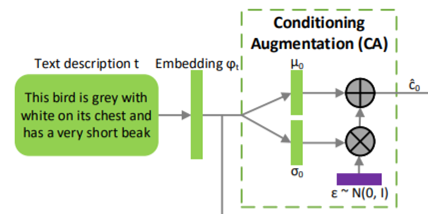

먼저 위의 구조에서 왼쪽 상단에 있는 Conditioning Augmentation을 살펴보겠다. VAE에 대해 알고 있다면 바로 이해할 수 있다.

어떤 text description t를 embedding ϕ(t) 공간으로 embedding을 하면서 텍스트를 어떠한 특정 벡터로 나타낸다. 이러한 벡터에서 µ와 σ를 추출한 후 Gaussian distribution를 따르는 noise를 sampling한 후 σ를 곱한후 다시 µ를 더하는 과정를 Conditioning Augmentation이라 한다.

Gaussian distribution에서 sampling한 text embedding을 사용하므로 randomness가 더해져 동일한 문장에 대해서도 다양한 이미지를 생성할 수 있다.

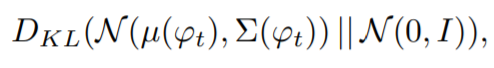

또한 generator의 loss에 위와 같은 식을 추가하게 된다.

### **Stage-1**

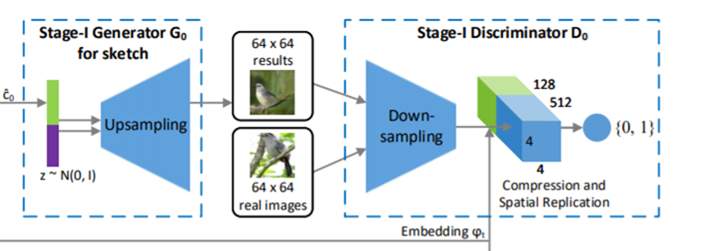

위에서 얻은 text feature와 일반적인 gan구조에서 사용되는 noise z를 표준정규분포에서 sampling 한 후 이를 concat하여 Stage-1에서 Generator를 통해 upsampling을 하여 text에 대한 초기 shape와 color를 나타내는 저화질의 이미지를 생성하게 된다. 그리고 generator가 생성한 저화질의 fake 이미지를 크기를 줄인 real 이미지와 함께 discriminator에 넣어 Down-sampling 후 text feature와 concat을 하여 real / fake를 판별한다.

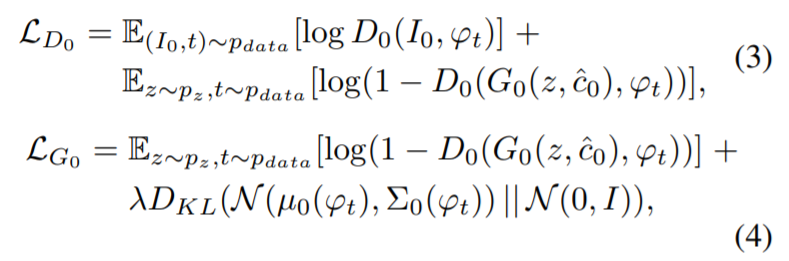

위의 식이 Stage-1의 loss function이다. Stage-1의 loss function은 일반적인 text to image에서 활용되는 conditional loss를 사용한다. discriminator의 경우에는 기존 text to image와 동일한 loss이며 generator의 경우에는 **추가적으로 Conditional Augmentation을 위한 KL-divergence를 hyper-parameter λ에 곱하여 더해준다. **

### **Stage-2**

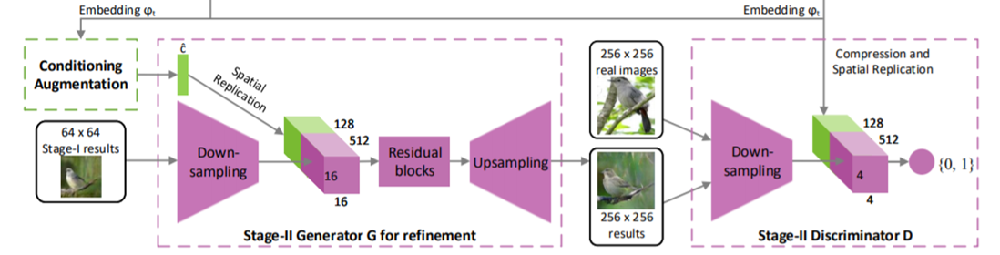

Stage-2는 Stage-1에서 생성한 이미지를 수정/보완하는 단계이다. Stage-1에서 생성한 결과를 Down-sampling한 값과 text에 대한 Conditional Augmentation를 concat하여 **Residual blocks**를 거쳐 Upsampling을 하여 최종적으로 얻고자하는 고화질 이미지를 생성하게 된다. 그리고 Stage-1과 동일하게 generator가 생성한 fake 이미지를 real 이미지와 함께 discriminator에 넣어 downsampling 후 text feature와 concat을 하여 real / fake를 판별한다.

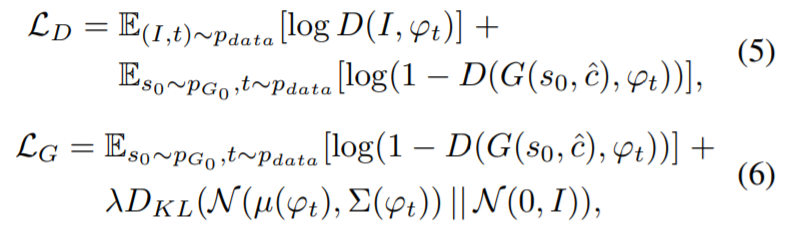

위의 식이 바로 Stage-2의 loss function이다. Stage-1의 loss function과 매우 유사하지만, Generator에 Stage-1에서 생성되는 값이 input으로 입력된다.

### **Pytorch**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.parallel
from miscc.config import cfg
from torch.autograd import Variable


def conv3x3(in_planes, out_planes, stride=1):
    "3x3 convolution with padding"
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)


# Upsale the spatial size by a factor of 2
def upBlock(in_planes, out_planes):
    block = nn.Sequential(
        nn.Upsample(scale_factor=2, mode='nearest'),
        conv3x3(in_planes, out_planes),
        nn.BatchNorm2d(out_planes),
        nn.ReLU(True))
    return block


class ResBlock(nn.Module):
    def __init__(self, channel_num):
        super(ResBlock, self).__init__()
        self.block = nn.Sequential(
            conv3x3(channel_num, channel_num),
            nn.BatchNorm2d(channel_num),
            nn.ReLU(True),
            conv3x3(channel_num, channel_num),
            nn.BatchNorm2d(channel_num))
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        residual = x
        out = self.block(x)
        out += residual
        out = self.relu(out)
        return out


class CA_NET(nn.Module):
    # some code is modified from vae examples
    # (https://github.com/pytorch/examples/blob/master/vae/main.py)
    def __init__(self):
        super(CA_NET, self).__init__()
        self.t_dim = cfg.TEXT.DIMENSION
        self.c_dim = cfg.GAN.CONDITION_DIM
        self.fc = nn.Linear(self.t_dim, self.c_dim * 2, bias=True)
        self.relu = nn.ReLU()

    def encode(self, text_embedding):
        x = self.relu(self.fc(text_embedding))
        mu = x[:, :self.c_dim]
        logvar = x[:, self.c_dim:]
        return mu, logvar

    def reparametrize(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        if cfg.CUDA:
            eps = torch.cuda.FloatTensor(std.size()).normal_()
        else:
            eps = torch.FloatTensor(std.size()).normal_()
        eps = Variable(eps)
        return eps.mul(std).add_(mu)

    def forward(self, text_embedding):
        mu, logvar = self.encode(text_embedding)
        c_code = self.reparametrize(mu, logvar)
        return c_code, mu, logvar


class D_GET_LOGITS(nn.Module):
    def __init__(self, ndf, nef, bcondition=True):
        super(D_GET_LOGITS, self).__init__()
        self.df_dim = ndf
        self.ef_dim = nef
        self.bcondition = bcondition
        if bcondition:
            self.outlogits = nn.Sequential(
                conv3x3(ndf * 8 + nef, ndf * 8),
                nn.BatchNorm2d(ndf * 8),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(ndf * 8, 1, kernel_size=4, stride=4),
                nn.Sigmoid())
        else:
            self.outlogits = nn.Sequential(
                nn.Conv2d(ndf * 8, 1, kernel_size=4, stride=4),
                nn.Sigmoid())

    def forward(self, h_code, c_code=None):
        # conditioning output
        if self.bcondition and c_code is not None:
            c_code = c_code.view(-1, self.ef_dim, 1, 1)
            c_code = c_code.repeat(1, 1, 4, 4)
            # state size (ngf+egf) x 4 x 4
            h_c_code = torch.cat((h_code, c_code), 1)
        else:
            h_c_code = h_code

        output = self.outlogits(h_c_code)
        return output.view(-1)


# ############# Networks for stageI GAN #############
class STAGE1_G(nn.Module):
    def __init__(self):
        super(STAGE1_G, self).__init__()
        self.gf_dim = cfg.GAN.GF_DIM * 8
        self.ef_dim = cfg.GAN.CONDITION_DIM
        self.z_dim = cfg.Z_DIM
        self.define_module()

    def define_module(self):
        ninput = self.z_dim + self.ef_dim
        ngf = self.gf_dim
        # TEXT.DIMENSION -> GAN.CONDITION_DIM
        self.ca_net = CA_NET()

        # -> ngf x 4 x 4
        self.fc = nn.Sequential(
            nn.Linear(ninput, ngf * 4 * 4, bias=False),
            nn.BatchNorm1d(ngf * 4 * 4),
            nn.ReLU(True))

        # ngf x 4 x 4 -> ngf/2 x 8 x 8
        self.upsample1 = upBlock(ngf, ngf // 2)
        # -> ngf/4 x 16 x 16
        self.upsample2 = upBlock(ngf // 2, ngf // 4)
        # -> ngf/8 x 32 x 32
        self.upsample3 = upBlock(ngf // 4, ngf // 8)
        # -> ngf/16 x 64 x 64
        self.upsample4 = upBlock(ngf // 8, ngf // 16)
        # -> 3 x 64 x 64
        self.img = nn.Sequential(
            conv3x3(ngf // 16, 3),
            nn.Tanh())

    def forward(self, text_embedding, noise):
        c_code, mu, logvar = self.ca_net(text_embedding)
        z_c_code = torch.cat((noise, c_code), 1)
        h_code = self.fc(z_c_code)

        h_code = h_code.view(-1, self.gf_dim, 4, 4)
        h_code = self.upsample1(h_code)
        h_code = self.upsample2(h_code)
        h_code = self.upsample3(h_code)
        h_code = self.upsample4(h_code)
        # state size 3 x 64 x 64
        fake_img = self.img(h_code)
        return None, fake_img, mu, logvar


class STAGE1_D(nn.Module):
    def __init__(self):
        super(STAGE1_D, self).__init__()
        self.df_dim = cfg.GAN.DF_DIM
        self.ef_dim = cfg.GAN.CONDITION_DIM
        self.define_module()

    def define_module(self):
        ndf, nef = self.df_dim, self.ef_dim
        self.encode_img = nn.Sequential(
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size (ndf*2) x 16 x 16
            nn.Conv2d(ndf*2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size (ndf*4) x 8 x 8
            nn.Conv2d(ndf*4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            # state size (ndf * 8) x 4 x 4)
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.get_cond_logits = D_GET_LOGITS(ndf, nef)
        self.get_uncond_logits = None

    def forward(self, image):
        img_embedding = self.encode_img(image)

        return img_embedding


# ############# Networks for stageII GAN #############
class STAGE2_G(nn.Module):
    def __init__(self, STAGE1_G):
        super(STAGE2_G, self).__init__()
        self.gf_dim = cfg.GAN.GF_DIM
        self.ef_dim = cfg.GAN.CONDITION_DIM
        self.z_dim = cfg.Z_DIM
        self.STAGE1_G = STAGE1_G
        # fix parameters of stageI GAN
        for param in self.STAGE1_G.parameters():
            param.requires_grad = False
        self.define_module()

    def _make_layer(self, block, channel_num):
        layers = []
        for i in range(cfg.GAN.R_NUM):
            layers.append(block(channel_num))
        return nn.Sequential(*layers)

    def define_module(self):
        ngf = self.gf_dim
        # TEXT.DIMENSION -> GAN.CONDITION_DIM
        self.ca_net = CA_NET()
        # --> 4ngf x 16 x 16
        self.encoder = nn.Sequential(
            conv3x3(3, ngf),
            nn.ReLU(True),
            nn.Conv2d(ngf, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.Conv2d(ngf * 2, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True))
        self.hr_joint = nn.Sequential(
            conv3x3(self.ef_dim + ngf * 4, ngf * 4),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True))
        self.residual = self._make_layer(ResBlock, ngf * 4)
        # --> 2ngf x 32 x 32
        self.upsample1 = upBlock(ngf * 4, ngf * 2)
        # --> ngf x 64 x 64
        self.upsample2 = upBlock(ngf * 2, ngf)
        # --> ngf // 2 x 128 x 128
        self.upsample3 = upBlock(ngf, ngf // 2)
        # --> ngf // 4 x 256 x 256
        self.upsample4 = upBlock(ngf // 2, ngf // 4)
        # --> 3 x 256 x 256
        self.img = nn.Sequential(
            conv3x3(ngf // 4, 3),
            nn.Tanh())

    def forward(self, text_embedding, noise):
        _, stage1_img, _, _ = self.STAGE1_G(text_embedding, noise)
        stage1_img = stage1_img.detach()
        encoded_img = self.encoder(stage1_img)

        c_code, mu, logvar = self.ca_net(text_embedding)
        c_code = c_code.view(-1, self.ef_dim, 1, 1)
        c_code = c_code.repeat(1, 1, 16, 16)
        i_c_code = torch.cat([encoded_img, c_code], 1)
        h_code = self.hr_joint(i_c_code)
        h_code = self.residual(h_code)

        h_code = self.upsample1(h_code)
        h_code = self.upsample2(h_code)
        h_code = self.upsample3(h_code)
        h_code = self.upsample4(h_code)

        fake_img = self.img(h_code)
        return stage1_img, fake_img, mu, logvar


class STAGE2_D(nn.Module):
    def __init__(self):
        super(STAGE2_D, self).__init__()
        self.df_dim = cfg.GAN.DF_DIM
        self.ef_dim = cfg.GAN.CONDITION_DIM
        self.define_module()

    def define_module(self):
        ndf, nef = self.df_dim, self.ef_dim
        self.encode_img = nn.Sequential(
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),  # 128 * 128 * ndf
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),  # 64 * 64 * ndf * 2
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),  # 32 * 32 * ndf * 4
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),  # 16 * 16 * ndf * 8
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),  # 8 * 8 * ndf * 16
            nn.Conv2d(ndf * 16, ndf * 32, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 32),
            nn.LeakyReLU(0.2, inplace=True),  # 4 * 4 * ndf * 32
            conv3x3(ndf * 32, ndf * 16),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),   # 4 * 4 * ndf * 16
            conv3x3(ndf * 16, ndf * 8),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True)   # 4 * 4 * ndf * 8
        )

        self.get_cond_logits = D_GET_LOGITS(ndf, nef, bcondition=True)
        self.get_uncond_logits = D_GET_LOGITS(ndf, nef, bcondition=False)

    def forward(self, image):
        img_embedding = self.encode_img(image)

        return img_embedding

위의 코드는 논문의 저자의 코드를 그대로 가져온 것이다.

## **Experiments**

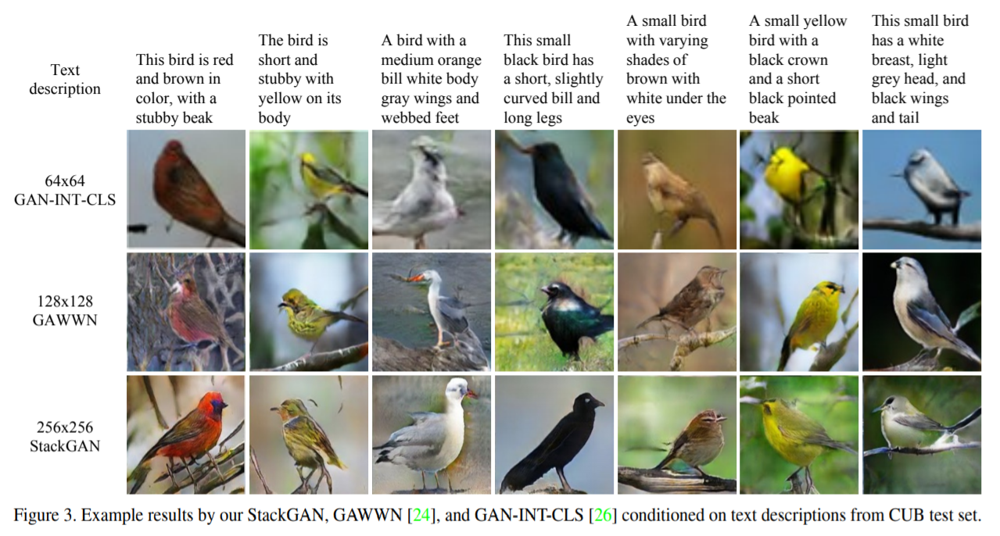

위의 그림 Figure 3은 CUB dataset에 대한 결과이다. Text description이 새에 대한 text이다. 그림을 보면 알 수 있듯이 StackGAN이 위의 다른 모델보다 보다 자연스러운 고화질의 이미지를 생성하는 것을 알 수 있다.

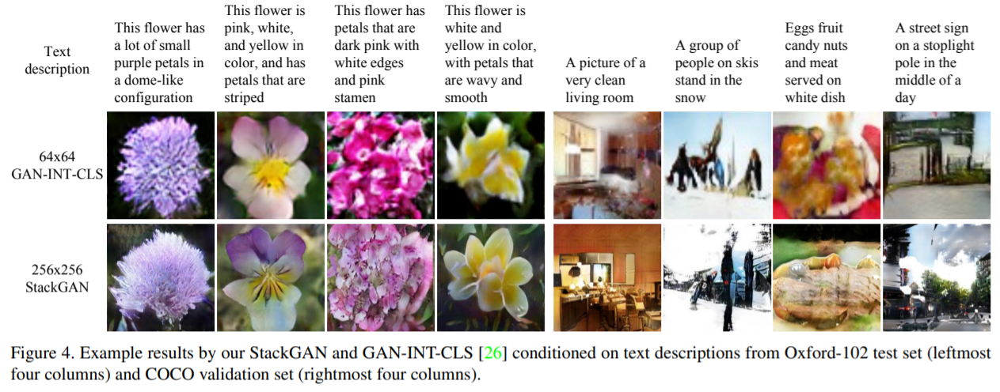

위의 그림 Figure 4는 꽃을 묘사한 Oxford-102 dataset과 실생활을 묘사한 MS-COCO dataset에 대한 GAN-INT-CLS와 StackGAN의 결과이다. Oxford-102 dataset의 경우 GAN-INT-CLS도 나름 준수한 이미지를 생성하지만 StackGAN이 훨씬 선명한 고화질의 데이터를 생성한다. MS-COCO의 경우는 GAN-INT-CLS의 결과를 보면 굉장히 뭉게진 이미지를 생성하지만, StackGAN의 결과를 보면 상대적으로 훨씬 고화질의 이미지를 생성한다.

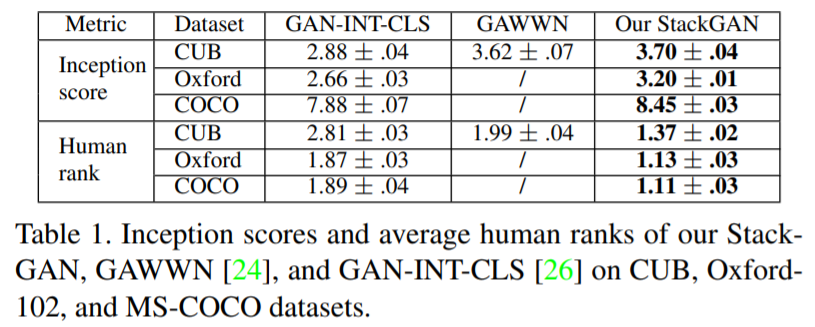

위의 표 Table 1은 GAN-INT-CLS, GAWWN, StackGAN의 inception score를 비교한 것이다. StackGAN이 모든 dataset에 대해 좋은 성능을 보여준다.

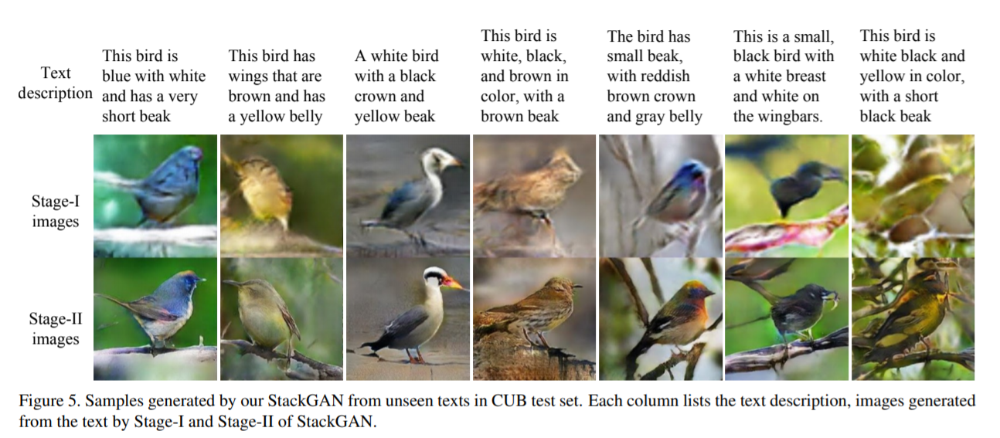

위의 그림 Figure 5는 Stage-1과 Stage-2를 비교하기 위한 그림이다. 위에서 계속 말한것처럼 Figure 5의 첫 번째 행에서와 같이 대부분의 경우 Stage-1은 Text description을 통해 object의 전반적인 거친 모양과 색상을 그릴 수 있다. 그러나 Stage-1은 일반적으로 다양한 결함, 누락된 세부 정보, 특히 전경 object에 대해 흐릿하다. 반면 두 번째 행에 표시된 것처럼 Stage-2는 해당 Text description을 더욱 잘 반영하기 위해 보다 높은 디테일과 더 높은 해상도 이미지를 생성한다. 정리하자면, Stage-1에서 그럴듯한 모양과 색상을 생성을 하고, Stage2는 세부 정보를 완성시킨다.

5번째 열의 그림을 보면 Text description에서는 "brown crown"이라고 적혀있지만, Stage-1의 그림은 blue crown이 있다. 하지만 Stage-2에서 다시 brown crown으로 수정된 것을 알 수 있다. 그리고 **7번째 열을 보면, Stage-1에서 그럴듯한 모양을 그리지 못하는 경우에도 Stage-2를 통해 그럴듯한 이미지를 생성**할 수 있다.

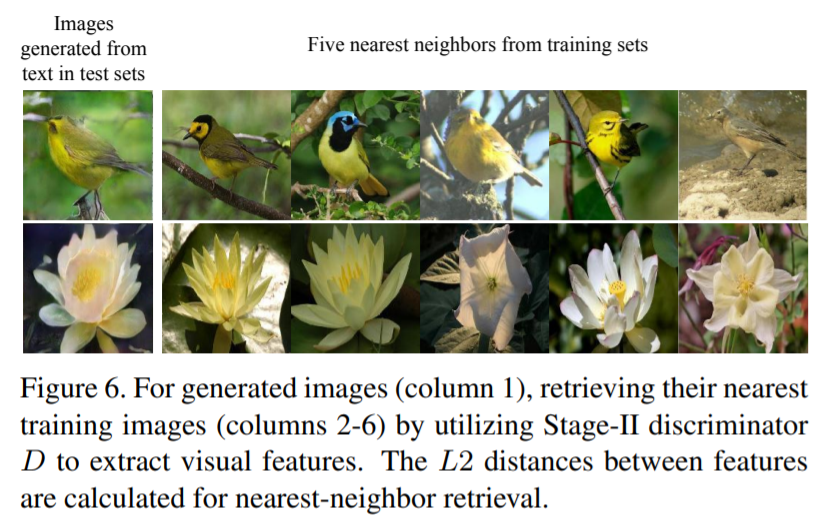

위의 그림 Figure 6은 **Mode Collapse**에 대해 나와있다. 논문의 저자는 StackGAN은 단순히 훈련 sample을 암기하는 것이 아닌 복잡한 기본 언어 이미지 관계를 캡처함으로써 좋은 결과를 달성한기 때문에 mode collapse가 안나타난다고 주장했다. 

Stage-2의 Discriminator에서 Generator가 생성한 이미지와 모든 훈련 이미지에서 시각적 기능을 추출한다. 생성된 각 이미지에 대해 교육 세트에서 가장 가까운 인접 이미지를 검색할 수 있는데, 위의 그림 Figure 6이 검색된 이미지를 시각적으로 나타낸 것이다. 따라서 생성된 이미지는 교육 sample과 일부 유사한 특성을 가지지만 본질적으로 다르다는 결론을 내렸다.

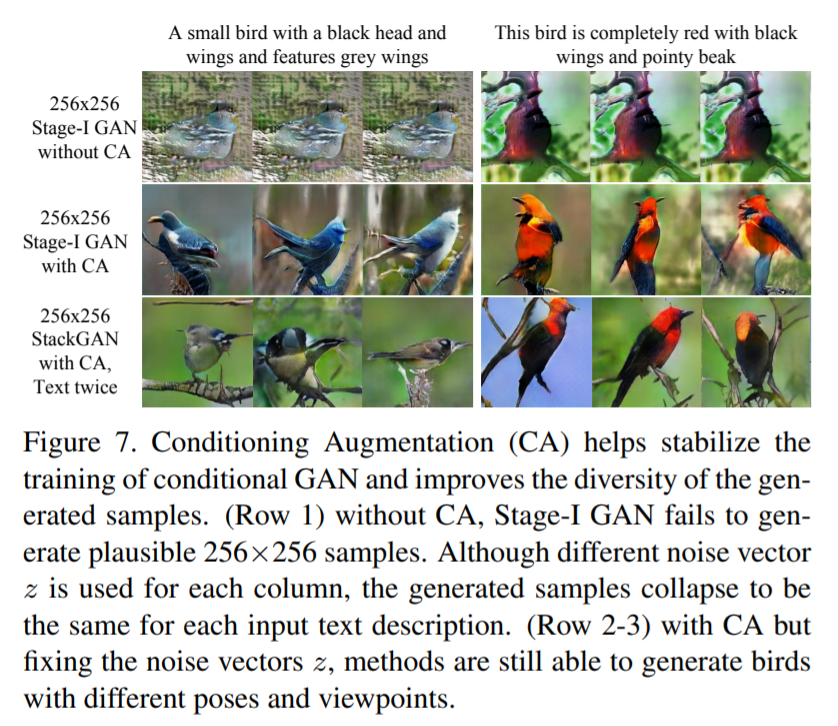

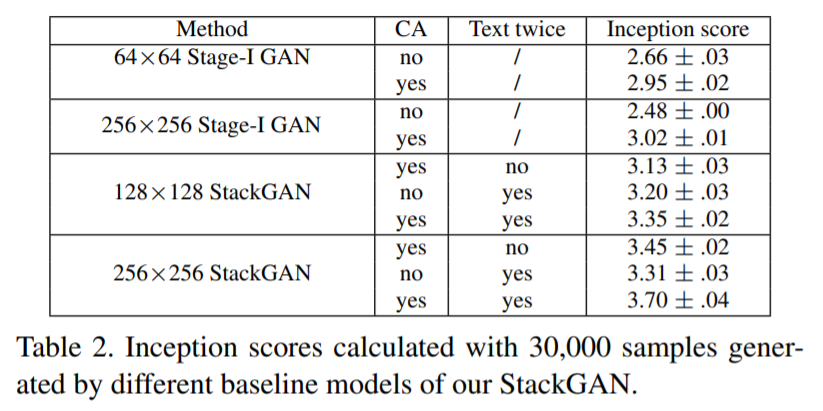

위의 그림 Figure 7과 표 Table 2에서는 StackGAN을 개발할때 실험했던 여러 모델들의 성능을 비교했다. 결론적으로 Stage-1과 Stage-2로 나누고 CA(Conditional Augmentation)을 추가한 256 x 256 StackGAN이 가장 우수한 성능을 보였다.

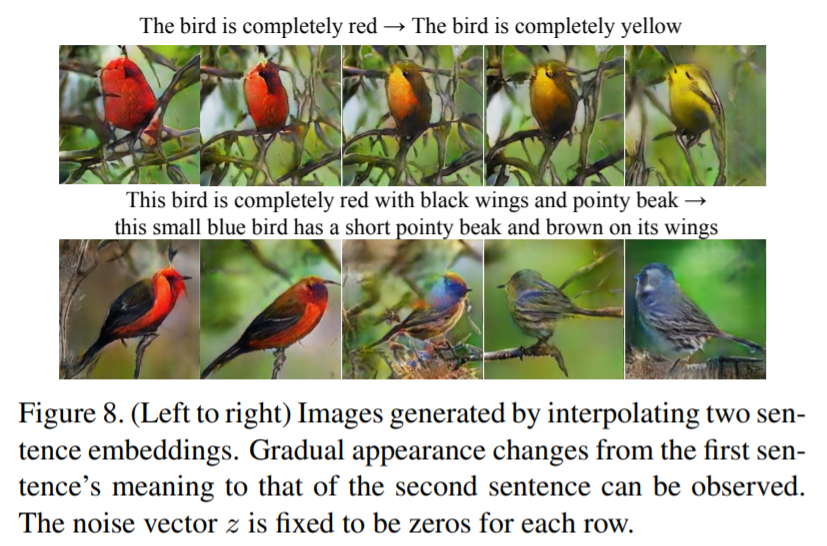

StackGAN이 부드러운 잠재 데이터 매니폴드를 학습한다는 것을 더욱 입증하기 위하여 위의 그림 Figure 8과 같이 이를 사용하여 **Sentence embedding interpolation**(선형 보간 문장 임베딩)에서 이미지를 생성한다. 노이즈 벡터 z를 수정하므로 생성된 이미지는 지정된 텍스트 설명에서만 유추하게 된다. 첫 번째 행의 이미지는 간단한 색 설명만 포함된 text에 의해 생성된다. 결과는 보간 임베딩에서 생성된 이미지가 색 변화를 정확하게 반영하고 그럴듯한 새 모양을 생성할 수 있다는 것을 보여준다. 두 번째 행은 더욱 복잡한 문장인 새의 외관에 대한 문장으로 생성된 것이다. 결과는 생성된 이미지가 기본 색상을 빨간색에서 파란색으로 변경하고 날개 색상을 검은색에서 갈색으로 변경되었다.